<img src="images/banner.jpg" width=100%>

Welcome to the Final Project! Projects in DSC 10 are similar in format to homeworks, but are different in a few key ways. First, a project is comprehensive, meaning that it draws upon everything we've learned this quarter so far. Second, since problems can vary quite a bit in difficulty, some problems will be worth more points than others. Finally, in a project, the problems are more open-ended; they will usually ask for some result, but won't tell you what method should be used to get it. There might be several equally-valid approaches, and several steps might be necessary. This is closer to how data science is done in "real life".

It is important that you **start early** on the project! It is the final assignment that is due this quarter, but it is due just four days before the Final Exam. You are especially encouraged to **find a partner** to work through the project with. If you work in a pair, you must follow the [Project Partner Guidelines
](https://dsc10.com/project-partners/) on the course website. In particular, you must work together at the same time, and you are not allowed to split up the problems and each work on certain problems. If working in a pair, you should submit one notebook to Gradescope for the both of you.

**Important:** The `otter` tests don't usually tell you that your answer is correct. More often, they help catch basic mistakes. It's up to you to ensure that your answer is correct. If you're not sure, ask someone (not for the answer, but for some guidance about your approach). Directly sharing answers between groups is not okay, but discussing problems with the course staff or with other students is encouraged.

Please do not import any additional packages - you don't need them, and our autograder may not be able to run your code if you do.

As you work through this project, there are a few resources you may want to have open:
- [DSC 10 Reference Sheet](https://drive.google.com/file/d/1ky0Np67HS2O4LO913P-ing97SJG0j27n/view)
- [CIT Textbook](https://inferentialthinking.com/chapters/intro.html)
- Other links in the [Resources](https://dsc10.com/resources/) and [Debugging](https://dsc10.com/debugging/) tabs of the course website

Start early, good luck, and let's get started! 😎

In [1]:
# Don't change this cell; just run it.
import babypandas as bpd
import numpy as np

import matplotlib.pyplot as plt
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (10, 5)

import otter
grader = otter.Notebook()

from scipy.stats import norm

from IPython.display import display, HTML, IFrame, clear_output 
from ipywidgets import interact, FloatSlider, IntSlider, fixed
from interaction import plot_meteorites, cdf_ppf_interact, decadal_interact, faster_perm_test

%load_ext autoreload
%autoreload 2

### Outline

Use this outline to help you quickly navigate to the part of the project you're working on:

- [About the Data 📖](#the-data)
- [Section 1: Seen vs. Recorded 👀](#q1)
- [Section 2: The View From Space 🔭](#q2)
- [Section 3: Long-Distance Relationship ✈️](#q3)
- [Section 4: Around the World 🌏](#q4)
- [Section 5: Confidence is Key 🔑](#q5)
- [Section 6: Decade-nt 🍰](#q6)

<div class="alert alert-block alert-warning"><b>Note</b>: Some questions are longer and more challenging than others. Questions worth more than one point have stars indicating their point value. You can expect these questions to be more challenging. Many questions will require you to pay close attention to the details and assumptions provided. Reading is key!</div>

<a name='the-data'></a>

## About the Data 📖

([jump to the outline](#Outline))

A **meteorite** is a piece of rock from outer space that survives entry into the Earth's atmosphere and strikes the Earth's surface. Some meteorites are quite beautiful!

<img width=50% src="images/meteorite.jpg">
<center>
<i>
<small>Credit: By User:Captmondo - Own work (photo), CC BY-SA 3.0, https://commons.wikimedia.org/w/index.php?curid=5752726
</small>
</i>
</center>

Specifically, we will work with a dataset that contains information on all known meteorite landings, downloaded from [NASA's Open Data Portal](https://data.nasa.gov/Space-Science/Meteorite-Landings/gh4g-9sfh) and collected by The Meteoritical Society. 

Note that meteorites, meteors, and meteoroids all refer to slightly different things.

<img width=50% src="images/infographic.png">
<center>
<i>
<small>Source: MEL Science
</small>
</i>
</center>


Run the cell below to load in our data as a DataFrame into the variable `raw_df`.

In [2]:
raw_df = bpd.read_csv('data/meteorite_landings.csv')
raw_df

,id,name,recclass,seen_falling,mass,year,decade,latitude,longitude
0,1,Aachen,L5,True,21.0,1880,1880,50.77500,6.08333
1,2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333
2,6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000
3,10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000
4,370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000
...,...,...,...,...,...,...,...,...,...
38089,31356,Zillah 002,Eucrite,False,172.0,1990,1990,29.03700,17.01850
38090,30409,Zinder,"Pallasite, ungrouped",False,46.0,1999,1990,13.78333,8.96667
38091,30410,Zlin,H4,False,3.3,1939,1930,49.25000,17.66667
38092,31357,Zubkovsky,L6,False,2167.0,2003,2000,49.78917,41.50460


This dataset contains 38094 rows and 9 columns. Each row represents one known meteorite. Here are descriptions of all 9 columns:

| Column | Description |
|:---|:---|
| `'id'`| Unique ID of the meteorite (`int`). |
| `'name'` | Name of the meteorite (`str`). |
| `'recclass'` | The classification of the meteorite. (`str`) |
| `'seen_falling'` | `True` if the meteorite was discovered while falling, and `False` if the meteorite was observed after it hit Earth (`bool`). |
| `'mass'` | The mass of the meteorite in grams (`float`). |
| `'year'` | The year in which the meteorite was recorded (`int`). Note that this is not necessarily the year in which it fell. | 
| `'decade'` | The decade in which the meteorite was recorded (`int`). Note that this is not necessarily the decade in which it fell. |
| `'latitude'` | The latitude of the meteorite's location (`float`). |
| `'longitude'` | The longitude of the meteorite's location (`float`). |


<a name='q1'></a>
## Section 1: Seen vs. Recorded 👀

([jump to the outline](#Outline))

Let's start by exploring where meteorites were seen falling and where they were recorded.

### Question 1.1

While the `'latitude'` and `'longitude'` tell us the precise location of a meteorite, it would be helpful to have a coarser description of where a meteorite was recorded. The file `'data/continents.csv'` is a CSV with two columns: `'id'` (the ID of a meteorite) and `'continent'` (the continent on which it was recorded).

Assign the variable `df` to a DataFrame that contains all of the columns already in `raw_df` with one additional column, `'continent'`, which includes the continent in which each meteorite was recorded. Set the index of `df` to `'id'`.

**_Hint:_** The file `'data/continents.csv'` does not have the same number of rows as `raw_df`, which means you will have to `merge`!

In [3]:
new_df=bpd.read_csv('data/continents.csv')
new_df

,id,continent
0,51686,Asia
1,23550,Asia
2,10199,Antarctica
3,16425,Antarctica
4,6905,Asia
...,...,...
38396,54111,Africa
38397,3851,Antarctica
38398,48543,Asia
38399,15732,Antarctica


In [4]:
df = raw_df.merge(new_df,right_on='id',left_on='id').set_index('id')
df

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
1,Aachen,L5,True,21.0,1880,1880,50.77500,6.08333,Europe
2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333,Europe
6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000,North America
10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000,North America
370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000,South America
...,...,...,...,...,...,...,...,...,...
31356,Zillah 002,Eucrite,False,172.0,1990,1990,29.03700,17.01850,Africa
30409,Zinder,"Pallasite, ungrouped",False,46.0,1999,1990,13.78333,8.96667,Africa
30410,Zlin,H4,False,3.3,1939,1930,49.25000,17.66667,Europe


In [5]:
grader.check("q1_1")

q1_1 results: All test cases passed!

Now that we've created `df`, we will use that DataFrame throughout the project and no longer use `raw_df`.

### Question 1.2 

Recall that the dataset contains both meteorites that are seen while falling and meteorites that are recorded after hitting the Earth (which may have potentially fallen thousands of years ago). At various points throughout this project we will want to restrict our attention to just the meteorites that were seen while falling, or compare the meteorites that were seen while falling to all meteorites that are recorded.

Assign `saw_fall` to a DataFrame that contains only the meteorites which were seen falling. Start with `df`, not `raw_df`.

In [6]:
saw_fall = df[df.get('seen_falling')==True]
saw_fall

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
1,Aachen,L5,True,21.0,1880,1880,50.77500,6.08333,Europe
2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333,Europe
6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000,North America
10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000,North America
370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000,South America
...,...,...,...,...,...,...,...,...,...
30408,Zhuanghe,H5,True,2900.0,1976,1970,39.66667,122.98333,Asia
30411,Zmenj,Howardite,True,246.0,1858,1850,51.83333,26.83333,Europe
30412,Zomba,L6,True,7500.0,1899,1890,-15.18333,35.28333,Africa


In [7]:
grader.check("q1_2")

q1_2 results: All test cases passed!

Let's start by comparing the number of meteorites **seen falling** and the total number of **meteorites recorded** in each continent.

### Question 1.3 

Below, assign `recorded_per_continent` to a Series, indexed by continent, that contains the total number of **recorded meteorites** per continent. The Series should be sorted in decreasing order.

Then, assign `seen_per_continent` to a Series, also indexed by continent, that contains the total number of meteorites **seen falling** per continent. The Series should also be sorted in decreasing order.

In [8]:
recorded_per_continent = df.groupby('continent').count().get('mass').sort_values(ascending=False)
seen_per_continent = saw_fall.groupby('continent').count().get('mass').sort_values(ascending=False)

# Don't change the lines below - they just display the two Series you created.
print('recorded_per_continent\n', recorded_per_continent, '\n', sep='')
print('seen_per_continent\n', seen_per_continent, '\n', sep='')

recorded_per_continent
continent
Antarctica       22094
Africa            9012
Asia              3522
North America     1810
Australia          633
South America      537
Europe             471
Name: mass, dtype: int64

seen_per_continent
continent
Asia             341
Europe           338
North America    180
Africa           136
South America     49
Australia         15
Name: mass, dtype: int64



In [9]:
grader.check("q1_3")

q1_3 results: All test cases passed!

It should be no surprise that the number of meteorites seen falling in each continent is smaller than the total number of meteorites recorded in each continent (since the former group of meteorites is a subset of the latter). What might be surprising, however, is how different these two distributions are. For instance, although Antarctica was the continent where the most meteorites were recorded, none were seen falling there.

To get a better visual understanding of our data, we can draw maps. To do this, we will import the package `folium` to help us draw the maps. Remember that both `df` and `saw_fall` have `'latitude'` and `'longitude'` columns that describe where meteorites were seen/found. 

In [10]:
# Don't change this cell; just run it.
import folium

Now run the code below, which shows how to create a map using `folium`. This map is centered at a latitude and longitude of (39, -98), which happens to be in Kansas.

In [11]:
# Don't change this cell; just run it.
m = folium.Map(location=[39.0, -98.0], zoom_start=4)
m

We can create markers on the map as shown below. Here we've made two markers: one for San Diego, and another for New York City.

In [12]:
# Try adding your own marker.
folium.Marker(location=[32.7157, -117.1611]).add_to(m)
folium.Marker(location=[40.7, -74]).add_to(m)
m

Let's see if we can detect any patterns in the locations of meteorites. The function `plot_meteorites` takes in a DataFrame of meteorites (like `df`) and uses `folium` to plot the location of each meteorite in the DataFrame.

For example, here are 4000 randomly-chosen meteorites (there are too many meteorites to visualize them all). These meteorites include those that were seen falling (in <span style='color:orange'><b>orange</b></span>) and those that were found afterwards (in <span style='color:blue'><b>blue</b></span>). Note that you can pan, zoom, and click markers to see the name of each meteorite.

In [13]:
# Don't change this cell; just run it.
plot_meteorites(df.sample(4000))

Pan to the very bottom, to Antarctica. What do you notice? 🤔

Now, let's plot only those meteorites that were seen falling (all of them, not just a random sample of them). Again, pan to Antarctica. What difference do you notice?

In [14]:
# Don't change this cell; just run it.
plot_meteorites(saw_fall)

It's not that hard to see why not many meteorites weren't seen falling in Antarctica – there aren't many people in Antarctica to see them fall! However, according to the values in `recorded_per_continent`, it seems that Antarctica is the continent in which the most meteorites were recorded, by far.

In [15]:
recorded_per_continent

continent
Antarctica       22094
Africa            9012
Asia              3522
North America     1810
Australia          633
South America      537
Europe             471
Name: mass, dtype: int64

That seems a little strange – let's investigate a little more.

Perhaps it's the case that so many meteorites are recorded in Antarctica because Antarctica is the largest continent in terms of land mass. To even the playing field, let's compute the **meteorite density** of each continent. We will define the meteorite density of a continent to be **the number of recorded meteorites in that continent divided by the area of that continent (in square kilometers)**.

Run the cell below to load in a DataFrame containing the area of all 7 continents.

In [16]:
# Don't change this cell; just run it.
areas = bpd.read_csv('data/areas.csv').set_index('Continent')
areas

,Area (km^2)
Continent,
Asia,44614000.0
Africa,30365000.0
North America,24230000.0
South America,17814000.0
Antarctica,14200000.0
Europe,10000000.0
Australia,7690000.0


### Question 1.4 

Assign `density` to another Series containing the meteorite densities of all 7 continents. 

In [17]:
density = recorded_per_continent/areas.get('Area (km^2)')
density

Africa           0.000297
Antarctica       0.001556
Asia             0.000079
Australia        0.000082
Europe           0.000047
North America    0.000075
South America    0.000030
dtype: float64

In [18]:
grader.check("q1_4")

q1_4 results: All test cases passed!

If your answer is correct, you'll see that Antarctica has both the most meteorites per unit area and the most meteorites overall. This suggests that Antarctica really does have more recorded meteorites than other continents.

The key word in the previous sentence is **recorded**. Is it really the case that a certain part of the Earth *attracts* more meteorites than other parts?  Probably not, but there is something going on here. Remember that meteorites are, by definition, meteors that survived the trip through the atmosphere long enough to hit the surface of the Earth. Therefore, it could be that certain regions of the planet have thinner atmospheres, making it *easier* for a meteor to survive entry. On the other hand, physics tells us that meteorite landings should be *randomly distributed* across the surface of the Earth. 

Could the concentration of meteorites be due to something else? Perhaps visualizing the Antarctic meteorites again can give us a clue. The code below shows meteorites in the vicinity of McMurdo Sound, Antarctica.

In [19]:
# Don't change this cell; just run it.
plot_meteorites(df[df.get('continent') == 'Antarctica'].sample(4000), center=(-75, 170), zoom=5)

You should notice that the meteorites are clustered. Why is this? Is there something special about the regions these meteorites were found in?

Perhaps the names of meteorites can give us a clue. Click a marker to see the meteorite's name, and repeat to learn about the different regions where meteorites were found. Search for some of these region names on Wikipedia to determine what the geology of the region is like. 

(You might learn a new word that starts with "mo" – this is related to the reason.)

### Question 1.5 

Why are meteorites so commonly recorded in Antarctica? Does this support the claim that meteorites are more likely to fall in Antarctica than elsewhere? Assign `q1_5` to either 1, 2, 3, or 4 below.

1. Meteorites are commonly recorded in Antarctica because it is easy to spot meteorites on ice. Yes, this supports the claim that more meteorites fall on Antarctica.

2. Meteorites are commonly recorded in Antarctica because it is easy to spot meteorites on ice. No, this does not support the claim that more meteorites fall on Antarctica.

3. Meteorites are commonly recorded in Antarctica because there are many researchers located in Antarctica. Yes, this supports the claim that more meteorites fall on Antarctica.

4. Meteorites are commonly recorded in Antarctica because there are many researchers located in Antarctica. No, this does not support the claim that more meteorites fall on Antarctica.

<!--
BEGIN QUESTION
name: q1_5
-->

In [20]:
q1_5 = 2

In [21]:
grader.check("q1_5")

q1_5 results: All test cases passed!

Before we move on, let's look at the meteorite recordings closest to San Diego, just for fun:

In [22]:
# Don't change this cell; just run it.
coords = np.column_stack([
    df.get('latitude'),
    df.get('longitude')
])

distances = np.sum((coords - np.array([32.7, -117.1])) ** 2, axis=1)
closest = df.iloc[np.argsort(distances)[:10]]
plot_meteorites(closest, center=(32.7, -117.1), zoom=8)

None close to UCSD – yet!

<a name='q2'></a>
## Section 2: The View From Space 🔭

([jump to the outline](#Outline))

In Section 1, you may have noticed that the map that depicted the location of each meteorite **seen falling** looked a lot like a world population map. A likely explanation for this is that a meteorite is more likely to be seen if it falls near a populated area. In fact, the map you saw in Section 1 looks very similar to this composite image of the Earth at night – the nighttime lights show areas that are densely populated.

<img src="./images/lights.jpg" width=600>

We might suppose that the number of meteorites spotted in a continent is proportional to the *population* of the continent, but this is not quite right. Consider, for instance, Asia, which has the greatest population out of any of the continents, by far. This population, however, is not spread evenly over the surface of the continent – it is concentrated in several areas. We can see this in the nighttime image above – large parts of Asia (such as Siberia, Mongolia, and Western China) are relatively sparsely inhabited.

Instead, we might suppose that the number of meteorites seen in a continent is proportional to the total area of the continent that is "sufficiently populated". One way to do this is to count, for each continent, the number of pixels in the above image which are brighter than some threshold. The more bright pixels, the more land area that is populated, and the more surface area where a falling meteorite is likely to be seen.

We have done this work for you. We broke the surface of the Earth up into 259,200 rectangular cells and counted the number of cells that are sufficiently populated for each continent. The results are contained in the DataFrame `populated_cells`. Run the cell below to take a look at the DataFrame.

In [23]:
# Don't change this cell; just run it.
populated_cells = bpd.read_csv('data/populated_cells.csv').set_index('Continent')
populated_cells

,Cells
Continent,
Asia,10092
Africa,5558
Europe,4608
North America,3181
South America,2645
Australia,176


### Question 2.1 

Assuming that a given meteorite will land in one of the six continents listed above, and that the probability that a meteorite is seen falling in a given continent is proportional to the number of sufficiently populated cells in that continent, create a Series named `probabilities` that contains the probability of a meteorite being seen falling in each continent.

Much of the project relies on your answer to this question. Make sure that you've answered it correctly and pass all test cases before proceeding.

In [24]:
probabilities = populated_cells.get('Cells')/populated_cells.get('Cells').sum()
probabilities

Continent
Asia             0.384311
Africa           0.211653
Europe           0.175476
North America    0.121135
South America    0.100724
Australia        0.006702
Name: Cells, dtype: float64

In [25]:
grader.check("q2_1")

q2_1 results: All test cases passed!

In Section 3, we will use the values in `probabilities` to conduct a hypothesis test. But for now, let's work with a slightly different scenario.

Suppose that we are astronauts who live at the International Space Station, and we're somehow able to see all the meteorites that land on Earth. 

<img src='images/space-station.jpg' width=500>

Let us assume that meteorites are seen landing in continents with the probabilities specified in `probabilities`, e.g. the probability that a given meteorite is seen landing in Asia is `probabilities.loc['Asia']`. Also assume that the continent in which a meteorite is seen landing is where it actually lands, and that each meteorite's landing location is independent of all other meteorites' landing locations.

### Question 2.2 

Suppose I see 3 meteorites land. What is the probability that all of them land in Europe? Assign your answer to the variable `prob_all_europe`.

In [26]:
prob_all_europe = (probabilities.loc['Europe'])**3
prob_all_europe

0.0054032274045044135

In [27]:
grader.check("q2_2")

q2_2 results: All test cases passed!

### Question 2.3  

Suppose again that I see 3 meteorites land. What is the probability that none of them land in Europe or Asia? Assign your answer to the variable `prob_none_europe_asia`.

In [28]:
prob_none_europe_asia = (1-(probabilities.loc['Europe']+probabilities.loc['Asia']))**3
prob_none_europe_asia

0.08530791685507044

In [29]:
grader.check("q2_3")

q2_3 results: All test cases passed!

### Question 2.4 ⭐⭐

Now we want to generalize the calculation we did in the previous question. Complete the implementation of the function `prob_none`, which takes in a positive integer `n` and a **list or array** of continent names, `continents`. The function should return the probability that, when I see `n` meteorites land, **none of them lands in any of the given `continents`**. 

For example, 
```py
prob_none(5, ['Europe', 'North America', 'Asia'])
```
should compute the probability that when I see 5 meteorites land, none of them land in Europe, North America, or Asia. 

For this function, and all other functions you'll write in this section, keep the following points in mind.
- Any input list or array of continents will not contain duplicates, and will only contain continent names from the `probabilities` Series (i.e. not Antarctica). 
- Your function should return a single number, not a list or array.
- You should make sure to test your function on a variety of inputs. 
- Our test cases will include a tolerance for rounding error, so don't worry if your output differs slightly from what you expect.

In [30]:
def prob_none(n, continents):
    prob=1
    for i in continents:
        prob=prob-(probabilities.loc[i])
    return prob**n

In [31]:
grader.check("q2_4")

q2_4 results: All test cases passed!

In [32]:
prob_none(5, ['Europe', 'North America', 'Asia'])

0.0033074047313405353

### Question 2.5 ⭐⭐

Next, let's consider a related question. Complete the implementation of the function `prob_all`, which takes in a positive integer `n` and a **list or array** of continents, `continents`. The function should return the probability that, when I see `n` meteorites land, **all of them land somewhere in the given `continents`**. 

For example, 
```py
prob_all(2, ['Africa', 'Australia])
```
should compute the probability that when I see 2 meteorites land, both of them land in Africa or Australia. This includes the possibility where they both land in the same continent, as well as the possibility that one lands in Africa and one lands in Australia. 

***Hint:*** Start with the code you wrote for the previous question and just make a few small modifications.

In [33]:
def prob_all(n, continents):
    probab=0
    for i in continents:
        probab=probab+probabilities.loc[i]
    return probab**n

In [34]:
grader.check("q2_5")

q2_5 results: All test cases passed!

In [35]:
prob_all(2, ['Africa', 'Australia'])

0.04767886777546464

### Question 2.6 ⭐⭐

Let's now replicate the behavior of `prob_all` in a different way, by taking advantage of the relationship between `prob_none` and `prob_all`. Within the body of the function `prob_all_again`, define the variable `some_continents` in such a way that `prob_all_again` returns the same output as `prob_all` on **any input**. (It's okay if the outputs of `prob_all` and `prob_all_again` differ slightly due to rounding error.)

In [36]:
def prob_all_again(n, continents):
    some_continents = np.array([])
    for continent in populated_cells.index:
        if continent not in continents:
            some_continents = np.append(some_continents, continent)
    return prob_none(n, some_continents)
prob_all_again(2, ['Africa', 'Australia'])

0.04767886777546462

In [37]:
grader.check("q2_6")

q2_6 results: All test cases passed!

### Question 2.7 ⭐⭐

Complete the implementation of the function `order_probability`, which takes in a **list or array** of continents and returns the probability of seeing one meteorite land in each of those continents, **in the order specified**.

For example,

```py
order_probability(['North America', 'Asia', 'Australia'])
```

should compute the probability of seeing a meteorite land in North America, then one in Asia, and then finally one in Australia. 

In [38]:
def order_probability(continents):
    prob=1
    for i in continents:
        prob=prob*probabilities.loc[i]
    return prob
order_probability(['North America', 'Asia', 'Australia'])

0.0003120106465990411

In [39]:
grader.check("q2_7")

q2_7 results: All test cases passed!

### Question 2.8 

Consider all possible lists of length 11 that would be valid inputs to `order_probability`. There are $6^{11}$ such lists, since for each of the 11 elements that we have in our list, we have 6 continents to choose from. (Remember, Antarctica is not part of `probabilities`.) 

Of those $6^{11}$ lists, which one would yield the highest probability when passed into the `order_probability` function? Assign your answer (as a **list**) to the variable `highest_prob_combination`.

**_Hint:_** This is a conceptual question; don't write a `for`-loop.

In [40]:
highest_prob_combination = ['Asia', 'Asia', 'Asia', 'Asia', 'Asia', 'Asia', 'Asia', 'Asia', 'Asia', 'Asia', 'Asia']
highest_prob_combination

['Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia']

In [41]:
grader.check("q2_8")

q2_8 results: All test cases passed!

### Question 2.9 ⭐⭐

Complete the implementation of the function `prob_one`, which takes in a positive integer `n` and the name of a continent `continent` and returns the probability that, when I see `n` meteorites, **exactly one of them lands in `continent`**. 

For instance `prob_one(3, 'Europe')` should compute the probability that when I see 3 meteorites, exactly one of them lands in Europe. To compute this probability, we should consider 3 mutually exclusive cases:
- Case 1: The first meteorite lands in Europe, and the second two don't.
- Case 2: The second meteorite lands in Europe, and the first and third don't.
- Case 3: The third meteorite lands in Europe, and the first two don't.

Each of these 3 cases has the same probability, since meteorite landing locations are independent for each meteorite. 

In [42]:
def prob_one(n, continent):
    prob=(probabilities.loc[continent]*((1-probabilities.loc[continent])**(n-1))) * n
    return prob
prob_one(3, 'Europe') 

0.3578867309307466

In [43]:
grader.check("q2_9")

q2_9 results: All test cases passed!

<a name='q3'></a>
## Section 3: Long-Distance Relationship ✈️

([jump to the outline](#Outline))

Recall the Series of `probabilities` you computed in Section 2:

In [44]:
probabilities

Continent
Asia             0.384311
Africa           0.211653
Europe           0.175476
North America    0.121135
South America    0.100724
Australia        0.006702
Name: Cells, dtype: float64

This Series contains the proportion of lit-up cells in the map in Section 2 that were in each continent. It can also be interpreted as containing the probability of a falling meteorite being seen in each continent. Note, this Series was created without using `df` or `saw_fall`.

### Question 3.1 

Now, using the data in `saw_fall`, assign `total_since_1980` to the **number** of meteorites that were seen falling since 1980 (including 1980). Then, assign `observed_proportions` to a **Series** containing the proportion of meteorites that were seen falling in each continent, among all meteorites that were seen falling since 1980. For instance, if 20% of the meteorites seen falling since 1980 were seen falling in Asia, then `observed_proportions.loc['Asia']` should evaluate to 0.2.

In [45]:
total_since_1980 = saw_fall[saw_fall.get('year')>=1980].get('seen_falling').sum()
observed_proportions = saw_fall[saw_fall.get('year')>=1980].groupby('continent').count().get('year')/total_since_1980

# Don't change the following two lines.
print('total_since_1980:', total_since_1980)
observed_proportions

total_since_1980: 179


continent
Africa           0.240223
Asia             0.385475
Australia        0.016760
Europe           0.122905
North America    0.184358
South America    0.050279
Name: year, dtype: float64

In [46]:
grader.check("q3_1")

q3_1 results: All test cases passed!

If you answered 3.1 correctly, you should have seen that 179 meteorites were seen falling since 1980. We will use this fact momentarily.

Let's take stock of what we've computed so far. We have a **theoretical** distribution for where meteorites are seen falling (stored in `probabilities`) and an **observed** distribution of where meteorites were actually seen falling (stored in `observed_proportions`).

Run the cell below to see these distributions side-by-side.

In [47]:
# Don't change this cell; just run it.
bpd.DataFrame().assign(theoretical=probabilities, observed=observed_proportions)

,theoretical,observed
Continent,,
Asia,0.384311,0.385475
Africa,0.211653,0.240223
Europe,0.175476,0.122905
North America,0.121135,0.184358
South America,0.100724,0.050279
Australia,0.006702,0.016760


_Note that there are only 6 continents in both `probabilities`and `observed_proportions` because there were no lit up cells in Antarctica, nor any meteorites seen falling!_

These distributions look similar, but are not quite the same. This begs the question – are the continents where meteorites are seen falling drawn from the distribution in `probabilities`? (In other words, is the difference between `probabilities` and `observed_proportions` explained by chance alone?) Or are the continents where meteorites are seen falling not drawn from the distribution in `probabilities`?

**Let's conduct a hypothesis test!** We'll use the null and alternative hypotheses described below:

- **Null Hypothesis**: The continents where meteorites are seen falling (since 1980) are generated by the distribution in `probabilities`, and any differences are due to random chance.
- **Alternative Hypothesis**: The continents where meteorites are seen falling (since 1980) are not generated by the distribution in `probabilities`.

Since we are going to compare categorical distributions, the test statistic we will use is the Total Variation Distance (TVD).

### Question 3.2 

Complete the implementation of the function `generate_proportions`, which accepts no arguments and simulates the continents of 179 meteorite sightings according to the distribution in `probabilities` (179 because 179 meteorites have been seen falling since 1980). `generate_proportions` should return an **array** of length 6 that contains the proportion of simulated meteorite sightings in each of the 6 continents (in the order that they appear in `probabilities`).

In [48]:
def generate_proportions():
    prop=np.random.multinomial(179,probabilities)/179
    return prop     

In [49]:
grader.check("q3_2")

q3_2 results: All test cases passed!

### Question 3.3 

Complete the implementation of the function `tvd`, which takes in two arrays or Series containing categorical distributions and returns the Total Variation Distance (TVD) between the two distributions.

Then, using `generate_proportions` to simulate meteorite sightings and `tvd` to compute test statistics, generate **10,000** simulated test statistics. Store them in an array named `tvd_stats`.

**_Hint:_** If you run into any errors while using the `abs` or `sum` functions, use `np.abs` and `np.sum` instead.

In [50]:
def tvd(a, b):
    return np.abs((b-a)).sum()/2

tvd_stats = np.array([])
for i in np.arange(10000):
    tvd_prop=generate_proportions()
    tvd_stat=tvd(tvd_prop,probabilities)
    tvd_stats=np.append(tvd_stats,tvd_stat)
tvd_stats    

array([0.05598229, 0.08267135, 0.07146158, ..., 0.08869917, 0.05268735,
       0.03399248])

In [51]:
grader.check("q3_3")

q3_3 results: All test cases passed!

After you finish Question 3.3, run the cell below to plot the empirical distribution of your simulated TVDs, with a black line drawn at the observed TVD.

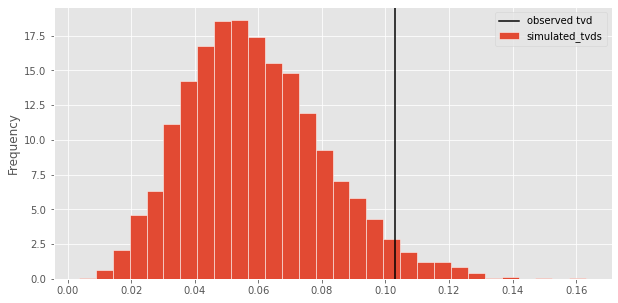

In [52]:
# Don't change this cell; just run it.
bpd.DataFrame().assign(simulated_tvds=tvd_stats).plot(kind='hist', density=True, bins=30, ec='w')
plt.axvline(x=tvd(observed_proportions, probabilities), color='black', label='observed tvd')
plt.legend();

### Question 3.4 

Calculate the probability under the null hypothesis of observing a TVD that is at least as extreme as the one observed in actuality. Assign the name `tvd_p_value` to your answer.

In [53]:
tvd_p_value = np.count_nonzero(tvd_stats>=tvd(observed_proportions, probabilities))/10000
tvd_p_value

0.0365

In [54]:
grader.check("q3_4")

q3_4 results: All test cases passed!

### Question 3.5 

As a refresher, here are our hypotheses:

- **Null Hypothesis**: The continents where meteorites are seen falling (since 1980) are generated by the distribution in `probabilities`, and any differences are due to random chance.
- **Alternative Hypothesis**: The continents where meteorites are seen falling (since 1980) are not generated by the distribution in `probabilities`.

Let's use a 0.05 significance level. What is the conclusion of our hypothesis test? Assign `q3_5` to either 1, 2, 3, or 4.

1. We accept the null hypothesis.
2. We need more data to decide whether to accept the null hypothesis or not.
3. We reject the null hypothesis.
4. The null hypothesis is consistent with our observation.

In [55]:
q3_5 = 3

In [56]:
grader.check("q3_5")

q3_5 results: All test cases passed!

### Question 3.6 

TVD, the test statistic we used in the previous hypothesis test, computes the distance between two categorical distributions. However, it turns out there are a variety of other test statistics that also compute the distance between two categorical distributions. One such statistic is what we'll call the <i>Maximum Distance (MD)</i>, which is defined as the **largest absolute difference between the proportions in any category**.

For example, consider the following two categorical distributions:

| Category | Distribution A | Distribution B |
| --- | --- | --- |
| 1 | 0.3 | 0.25 |
| 2 | 0.4 | 0.25 |
| 3 | 0.2 | 0.25 |
| 4 | 0.1 | 0.25 |

The absolute differences for each category are 0.05, 0.15, 0.05, and 0.15, and the largest of these is 0.15. So, the MD between Distribution A and Distribution B is 0.15.

Below, complete the implementation of the function `maximum_distance`, which takes in two arrays or Series of categorical distributions and returns the MD between them. Make sure to test your function on various inputs yourself.

In [57]:
def maximum_distance(a, b):
    dist=np.abs(b-a)
    return dist.max()

In [58]:
grader.check("q3_6")

q3_6 results: All test cases passed!

### Question 3.7 ⭐⭐⭐

Let us now try and generalize the work you did in Questions 3.3 and 3.4 to run a hypothesis test and compute a p-value, but this time for **any** test statistic that computes the "distance" between two categorical distributions. Below, complete the implementation of the function `categorical_test`, which takes in
- `distance_fn`, a **function** that takes in two arrays/Series and returns some measure of the "distance" between the two arrays (like `maximum_distance`, or `tvd`), and
- `show_hist`, either `True` or `False`

`categorical_test` should run a hypothesis test for the null and alternative hypothesis established after Question 3.1, using `distance_fn` as the test statistic. Specifically, your function should:
- generate **10,000** simulated distributions using `generate_proportions()`,
- find the distance between each simulated distribution and `probabilities` using the `distance_fn` specified,
- compute and return a p-value, and
- draw a histogram with a black line if `show_hist` is `True`

For example, `categorical_test(maximum_distance, True)` should return the p-value for a hypothesis test that uses `maximum_distance` as the distance function and should draw a histogram of simulated maximum distances, with a black line at the observed maximum distance.

**_Hints:_** 

- The code you write to implement `categorical_test` will look a lot like the code you wrote in 3.3 and 3.4. To draw the histogram, start by copying the plotting code we provided you with and change just the pieces that are necessary.
- Remember that the argument `distance_fn` itself is a function that takes in two arguments. Somewhere in your implementation of `categorical_test` you'll need to call this function by writing  `distance_fn(..., ...)`, where the blanks are replaced with arrays or Series.

0.1422

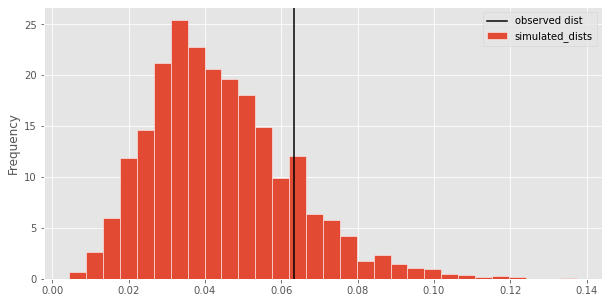

In [59]:
def categorical_test(distance_fn, show_hist):
    dists=np.array([])
    for i in np.arange(10000):
        dist=distance_fn(generate_proportions(),probabilities)
        dists=np.append(dists,dist)
   
    if show_hist==True:
        bpd.DataFrame().assign(simulated_dists=dists).plot(kind='hist', density=True, bins=30, ec='w')
        plt.axvline(x=distance_fn(observed_proportions, probabilities), color='black', label='observed dist')
        plt.legend();
    return np.count_nonzero(dists>=distance_fn(observed_proportions,probabilities))/10000
        
     
    
    
# If your function was implemented correctly, you should see a probability and a histogram below.
categorical_test(maximum_distance, True)

In [60]:
grader.check("q3_7")

q3_7 results: All test cases passed!

### Question 3.8 

At the 0.05 significance level, is the conclusion of our hypothesis test using MD as the test statistic the same as the conclusion of our hypothesis test using TVD as the test statistic? Assign `md_same_as_tvd` to either `True` or `False` below.

In [61]:
md_same_as_tvd = False

In [62]:
grader.check("q3_8")

q3_8 results: All test cases passed!

### Question 3.9 

The `categorical_test` function you implemented in 3.7 takes as an argument a distance function, `distance_fn`, which describes how "different" two categorical distributions are. Defining characteristics of a distance function are that:
- the distance between a distribution and itself is 0
- the distance between two different distributions is positive

Which of the following functions is a valid distance function, according to the characteristics above? Assign `valid_distance` to **a list** containing the options that are valid distance functions. For example, if you believe options 1 and 2 are valid distance functions, write `valid_distance = [1, 2]`. If you believe none of the options are valid distance functions, assign `valid_distance` to an empty list.

```py
def option1(a, b):
    return np.mean((a - b) ** 2)
    
def option2(a, b):
    return np.mean((a - b) ** 3)
    
def option3(a, b):
    return len(a) * tvd(a, b)
    
def option4(a, b):
    return np.min((a + b) / 2 - 1)
```

In [63]:
valid_distance = [1,3]

In [64]:
grader.check("q3_9")

q3_9 results: All test cases passed!

<a name='q4'></a>
## Section 4: Around the World 🌏

([jump to the outline](#Outline))

Here's a potentially interesting observation: the median mass of meteorites seen falling in Asia is larger than the median mass of meteorites seen falling in North America.

Run the code below to convince yourself:

In [65]:
# Don't change this cell; just run it.
saw_fall[saw_fall.get('continent') == 'Asia'].get('mass').median()

2600.0

In [66]:
# Don't change this cell; just run it.
saw_fall[saw_fall.get('continent') == 'North America'].get('mass').median()

2111.87

Is there a real difference between the mass of meteorites seen falling in Asia and those seen falling in North America? Or is the observed difference solely due to random chance? Let's investigate this using a hypothesis test once again. Here are our hypotheses:

- **Null Hypothesis:** The masses of meteorites seen falling in Asia come from the same distribution as the masses of meteorites seen falling in North America. 
- **Alternative Hypothesis:** The median mass of meteorites seen falling in Asia is larger than the median mass of meteorites seen falling in North America.

Since we are comparing **two** numerical samples, we will conduct a permutation test. Make sure you understand why before proceeding.

### Question 4.1 ⭐⭐

Using the DataFrame `saw_fall` as a starting point, run a permutation test for the hypotheses stated above. As the test statistic, use the **difference in group medians** ( `'Asia'` minus `'North America'`). Run **1,000** permutations in your test. 

Our autograder will check that you define the following four variables:

- `asia_na`, a DataFrame that contains only the rows for `'Asia'` and `'North America'` and only the columns that are relevant for the permutation test
- `diff_medians`, an array of your 1000 simulated differences in group medians
- `observed_diff`, the observed difference in group medians
- `mass_p_value`, the p-value for this permutation test

Your code should take at most a few minutes to run.

In [67]:
saw_fall[(saw_fall.get('continent') == 'Asia')|(saw_fall.get('continent') == 'North America')]

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000,North America
10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000,North America
379,Adhi Kot,EH4,True,4239.0,1919,1910,32.10000,71.80000,Asia
390,Adzhi-Bogdo (stone),LL3-6,True,910.0,1949,1940,44.83333,95.16667,Asia
426,Akaba,L6,True,779.0,1949,1940,29.51667,35.05000,Asia
...,...,...,...,...,...,...,...,...,...
30388,Zaisan,H5,True,463.0,1963,1960,47.50000,83.00000,Asia
30389,Zaisho,"Pallasite, PMG-an",True,330.0,1898,1890,33.70000,133.80000,Asia
30391,Zaoyang,H5,True,14250.0,1984,1980,32.30000,112.75000,Asia


In [68]:
asia_na = saw_fall[(saw_fall.get('continent') == 'Asia')|(saw_fall.get('continent') == 'North America')].get(['mass','continent'])
diff_medians = np.array([])
for i in np.arange(1000):
    shuffled=np.random.permutation(asia_na.get('continent'))
    new=asia_na.assign(Shuffled=shuffled)
    medians=new.groupby('Shuffled').median().get('mass')
    diff_median=medians.loc['Asia']-medians.loc['North America']
    diff_medians=np.append(diff_medians,diff_median)
observed_diff = asia_na.groupby('continent').median().get('mass').loc['Asia']-asia_na.groupby('continent').median().get('mass').loc['North America']
mass_p_value = np.count_nonzero(diff_medians>=observed_diff)/1000
mass_p_value

0.234

In [69]:
grader.check("q4_1")

q4_1 results: All test cases passed!

Run the cell below to visualize the distribution of our simulated differences in medians. You will see a histogram with a black line, which represents the observed difference in medians.

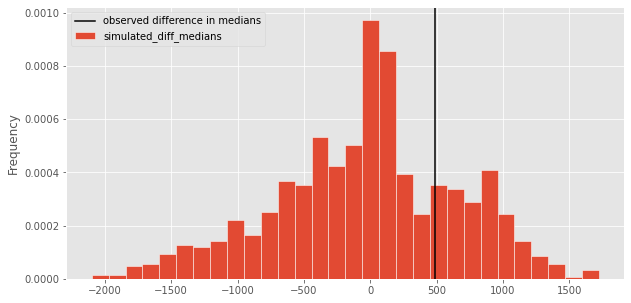

In [70]:
# Don't change this cell; just run it.
bpd.DataFrame().assign(simulated_diff_medians=diff_medians).plot(kind='hist', density=True, bins=30, ec='w')
plt.axvline(x=observed_diff, color='black', label='observed difference in medians')
plt.legend();

Under any reasonable cutoff, we'd fail to reject the null. Our data is consistent with the null hypothesis that the masses of meteorites that were seen falling in Asia and that were seen falling in North America come from the same distribution.

You may have noticed that we only used 1,000 repetitions in our previous permutation test. That's because the way that we've implemented permutation tests so far – repeatedly adding a column to a DataFrame and grouping – is quite slow.

**It turns out that there's a faster way to conduct a permutation test!**

Let's work through the general idea using an example. Suppose we have the following DataFrame, consisting of meteorites from `'Asia'` and `'North America'`:

| | **mass** | **continent** |
| --- | --- | --- |
| **0** | 4 | North America |
| **1** | 8 | Asia |
| **2** | 10 | Asia |
| **3** | 9 | North America |
| **4** | 11 | Asia |
| **5** | 6 | Asia |

This DataFrame has 6 meteorites in total – 4 from `'Asia'` and 2 from `'North America'`. The purpose of shuffling is to randomly assign the 6 masses to continents so that 4 belong to `'Asia'` and 2 belong to `'North America'` (remember, under the null hypothesis, masses of meteorites seen falling in both continents come from the same distribution). Here's one way to do that **and** calculate the relevant test statistic (difference between the `'Asia'` median mass and `'North America'` median mass), that doesn't involve using `.assign` or `.groupby`:

- First, shuffle the `'mass'` column.
- The first 4 values in the `'mass'` column are assigned to `'Asia'` – take their median and call that the median of the `'Asia'` group.
- The remaining 2 values in the `'mass'` column are assigned to `'North America'` – take their median and call that the median of the `'North America'` group.

For example, suppose we shuffle the `'mass'` column above and get `np.array([11, 10, 8, 9, 4, 6])`:
- The `'Asia'` masses would be 11, 10, 8, and 9. The median of these 4 is 9.5.
- The `'North America'` masses would be 4 and 6. The median of these 2 is 5.
- So our test statistic, **median `'Asia'` mass minus median `'North America'`** mass, is 9.5 - 5 = 4.5.

This method computes the same test statistic as our earlier permutation test, but works quicker under the hood. Run the cell below and click through the slideshow to see a summary of this approach.

In [71]:
faster_perm_test()

### Question 4.2 ⭐⭐

Below, complete the implementation of the function `single_simulated_group_diff`, which takes in:
- `input_df`, a DataFrame with two columns `'mass'` and `'continent'`, made up of only meteorites from `'Asia'` and `'North America'` (note that this can have any number of meteorites for each of these two continents, not just 4 and 2), and
- `func`, a function that takes in an array or Series and returns a number, like `np.median` or `np.mean` (think of this as a **statistic**).

The function `single_simulated_group_diff` should shuffle the `'mass'` column in `input_df` **just once**, and use the method outlined above to compute the difference in group **statistics** for that shuffled set of masses. The statistic you use should be computed using the passed in function `func`; for instance, if `func` is `np.median` you will compute the difference in group medians, and if `func` is `np.mean` you will compute the difference in group means. Regardless of what `func` is, you should compute the `'Asia'` statistic minus the `'North America'` statistic, as in 4.1.

**_Hints:_** 
- [`np.random.permutation`](https://numpy.org/doc/stable/reference/random/generated/numpy.random.permutation.html) might be helpful.
- To get the first `a` elements in the array `arr`, use `arr.take(np.arange(a))`. 
- A crucial step in defining `single_simulated_group_diff` is determining the number of meteorites in `'Asia'` (or in `'North America'`).
- Make sure not to use `.assign` or `.groupby` anywhere in your solution.

In [72]:
def single_simulated_group_diff(input_df, func):
    x = np.random.permutation(input_df.get('mass'))
    a = input_df[input_df.get('continent')=='Asia'].shape[0]
    func_asia=x.take(np.arange(a))
    func_na=x.take(np.arange(a,input_df.shape[0]-1))
    diff=func(func_asia)-func(func_na)
    return diff
single_simulated_group_diff(asia_na, np.median)

403.0

In [73]:
grader.check("q4_2")

q4_2 results: All test cases passed!

### Question 4.3 

Write another function, `many_simulated_group_diffs`, that takes in 3 arguments, `input_df`, `func`, and `repetitions`. It should call your `single_simulated_group_diff` function `repetitions` times, each time with the arguments `input_df` and `func`. It should return an array of length `repetitions` such that each element is a value returned by a single call to `single_simulated_group_diff`.

**_Hint:_** If you get an error saying `mean() got an unexpected keyword: axis`, make sure that in Question 4.2 the argument you give to `func` is an array, not a Series. This is because functions like `np.mean` don't work with Series in `babypandas`. If you need to, you can convert a Series to an array by using the function `np.array` (though our solution doesn't require us to do this).

In [74]:
def many_simulated_group_diffs(input_df, func, repetitions):
    arr=np.array([])
    for i in np.arange(repetitions):
        arr_call=single_simulated_group_diff(input_df, func)
        arr=np.append(arr,arr_call)
    return arr

In [75]:
grader.check("q4_3")

q4_3 results: All test cases passed!

If you answered everything correctly, then the following code should show a histogram similar to the one you saw after Question 4.1. **It should also run much more quickly than your code from 4.1, showing how much faster this alternative permutation test technique is compared to the "traditional" technique from class.**

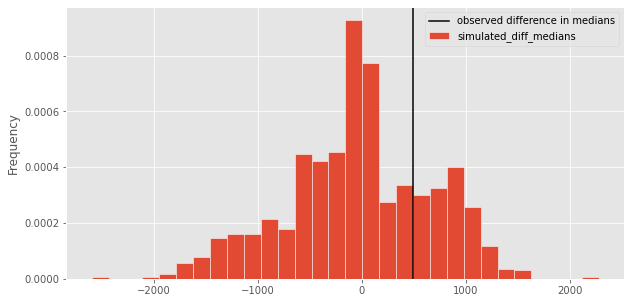

In [76]:
# Don't change this cell; just run it.
values = many_simulated_group_diffs(asia_na, np.median, 1000)
bpd.DataFrame().assign(simulated_diff_medians=values) \
               .plot(kind='hist', density=True, ec='w', bins=30);
plt.axvline(x=observed_diff, color='black', label='observed difference in medians')
plt.legend();

So far, we've been using the difference in group **medians** as our test statistic. What if we instead want to use the difference in group **means** as the test statistics?

Fortunately, we can do this easily now with your `many_simulated_group_diffs` function:

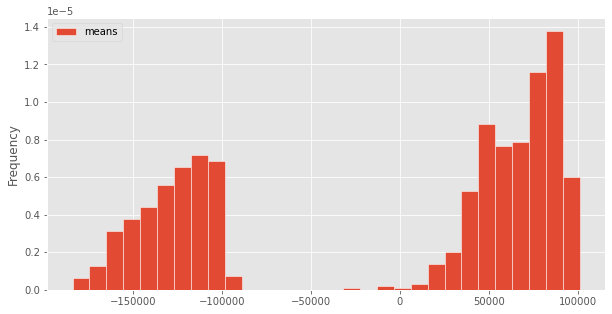

In [77]:
# Don't change this cell; just run it.
values = many_simulated_group_diffs(asia_na, np.mean, 1000)
bpd.DataFrame().assign(means=values) \
               .plot(kind='hist', density=True, ec='w', bins=30);

There seem to be two "clusters" with a large gap between them when we use the difference in group means as our test statistic. Why is this? The answer can be seen by looking at `asia_na` when sorted by mass in descending order:

In [78]:
# Don't change this cell; just run it.
asia_na.sort_values('mass', ascending=False).take(np.arange(10))

,mass,continent
id,,
23593,23000000.0,Asia
12171,4000000.0,Asia
2278,2000000.0,North America
17922,1100000.0,North America
12379,1100000.0,Asia
12087,600000.0,Asia
18101,408000.0,North America
23724,325000.0,Asia
10059,320000.0,North America


### Question 4.4 

Which of the following best explains why there is a gap in histogram of the empirical distribution of the differences in group **means** but  not in the histogram of the empirical distribution of the differences in group **medians**? Assign either 1, 2, 3, or 4 to `q4_4` below.
1. There is an issue with the bins that we've chosen for our histogram. If we choose narrower bins, we will not see a large gap.
2. Meteorites seen falling in Asia have a greater mean mass than meteorites seen falling in North America.
3. There is an outlier. The mean is affected greatly by an outlier, so whichever simulated group that the outlier is in will have the higher group mean. However, the group median is not affected by a single outlier.
4. There are more meteorites in one group than in the other, so after generating simulated groups, the group with more meteorites has a greater mean mass.

In [79]:
q4_4 = 3

In [80]:
grader.check("q4_4")

q4_4 results: All test cases passed!

### Question 4.5 

Now, run the permutation test using the difference in group means as the test statistic, but remove the meteorite with the largest mass. Assign `diff_means` to an array of **10,000** simulated **differences in group means** (should only take one line to compute), and `mass_p_value_means` to the p-value of the permutation test.

**_Hints:_**
- It's a good idea to create a separate DataFrame that has all of the rows in `asia_na`, minus the row for the heaviest meteorite.
- Use your `many_simulated_group_diffs` function to generate your simulated test statistics. To compute the observed statistic, you will have to group.

In [81]:
asia_na[(asia_na.get('mass'))<asia_na.get('mass').max()]

,mass,continent
id,,
6,107000.0,North America
10,1914.0,North America
379,4239.0,Asia
390,910.0,Asia
426,779.0,Asia
...,...,...
30388,463.0,Asia
30389,330.0,Asia
30391,14250.0,Asia


In [82]:
diff_means = np.array([])
new_df=asia_na[asia_na.get('mass')<asia_na.get('mass').max()]
new_obs = new_df.groupby('continent').mean().loc['Asia']-new_df.groupby('continent').mean().loc['North America']
diff_mean=many_simulated_group_diffs(new_df,np.mean,10_000)
diff_means=np.append(diff_means,diff_mean)
mass_p_value_means = np.count_nonzero(diff_means>=new_obs)/10_000
mass_p_value_means

0.6607

In [83]:
grader.check("q4_5")

q4_5 results: All test cases passed!

Run the cell below to see the differences in group means that you simulated.

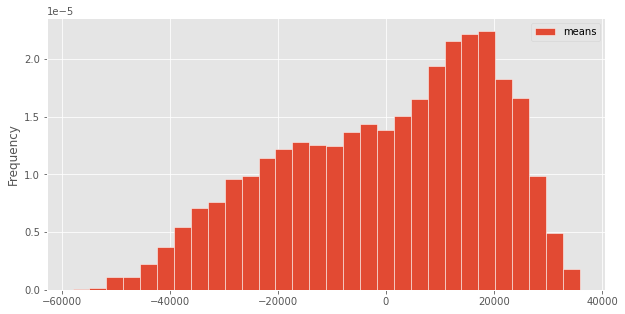

In [84]:
# Don't change this cell; just run it.
bpd.DataFrame().assign(means=diff_means) \
               .plot(kind='hist', density=True, ec='w', bins=30);

That looks a lot more regular! As you can see, outliers can greatly affect statistical tests.


<a name='q5'></a>
## Section 5: Confidence is Key 🔑

([jump to the outline](#Outline))

Consider once again the meteorites in the `saw_fall` DataFrame.

In [85]:
saw_fall

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
1,Aachen,L5,True,21.0,1880,1880,50.77500,6.08333,Europe
2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333,Europe
6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000,North America
10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000,North America
370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000,South America
...,...,...,...,...,...,...,...,...,...
30408,Zhuanghe,H5,True,2900.0,1976,1970,39.66667,122.98333,Asia
30411,Zmenj,Howardite,True,246.0,1858,1850,51.83333,26.83333,Europe
30412,Zomba,L6,True,7500.0,1899,1890,-15.18333,35.28333,Africa


Again, `saw_fall` only contains the meteorites that were seen falling. However, it does not contain information about **all** meteorites that fell in a given continent, because many meteorites fell but were not seen. In this way, `saw_fall` contains a **sample** of the meteorites that fell in each continent.

As such, we might be interested in determining an estimate for the true median mass of all meteorites that have fallen in a given continent, given just the information in `saw_fall`. Sounds like it's time to bootstrap!

### Question 5.1 ⭐⭐

Let's start with `'North America'`. Below, assign `na_boot_medians` to an array of **2,000** bootstrapped medians, each of which is the median of a bootstrapped resample of only the meteorites seen falling in `'North America'`. Then, assign `na_ci` to an array with two elements – the left and right endpoints of a 95% confidence interval for the true median mass of all meteorites that were seen falling in `'North America'`.

In [86]:
saw_fall[saw_fall.get('continent')=='North America']

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
6,Abee,EH4,True,107000.00,1952,1950,54.21667,-113.000000,North America
10,Acapulco,Acapulcoite,True,1914.00,1976,1970,16.88333,-99.900000,North America
2276,Allegan,H5,True,32000.00,1899,1890,42.53333,-85.883330,North America
2278,Allende,CV3,True,2000000.00,1969,1960,26.96667,-105.316670,North America
2295,Andover,L6,True,3200.00,1898,1890,44.61667,-70.750000,North America
...,...,...,...,...,...,...,...,...,...
24250,Wethersfield (1971),L6,True,350.00,1971,1970,41.70000,-72.650000,North America
24251,Wethersfield (1982),L6,True,2756.00,1982,1980,41.71056,-72.673610,North America
49514,Whetstone Mountains,H5,True,2138.74,2009,2000,31.96185,-110.434183,North America


In [87]:
na_boot_medians = np.array([])
for i in np.arange(2000):
    sample_saw=saw_fall[saw_fall.get('continent')=='North America'].sample(saw_fall[saw_fall.get('continent')=='North America'].shape[0],replace=True)
    median_saw=sample_saw.get('mass').median()
    na_boot_medians=np.append(na_boot_medians,median_saw)
na_ci = np.array([np.percentile(na_boot_medians, 2.5), np.percentile(na_boot_medians, 97.5)])
na_ci

array([1471.5, 3450. ])

In [88]:
grader.check("q5_1")

q5_1 results: All test cases passed!

### Question 5.2 

Now, generalize the work you did in the previous part. Define a function that takes in a `continent` and a number `p` and returns a p% confidence interval (stored as an **array** of two elements) for the median mass of meteorites in that continent. Again use **2000** resamples.

In [89]:
def continent_median_ci(continent, p):
    boot_medians=np.array([])
    for i in np.arange(2000):
        sample_saw=saw_fall[saw_fall.get('continent')==continent].sample(saw_fall[saw_fall.get('continent')==continent].shape[0],replace=True)
        median_saw=sample_saw.get('mass').median()
        boot_medians=np.append(boot_medians,median_saw)
    ci=np.array([np.percentile(boot_medians,(100-p)/2),np.percentile(boot_medians,100-(100-p)/2)])
    return ci
continent_median_ci('North America', 95)    

array([1477.5, 3500. ])

In [90]:
grader.check("q5_2")

q5_2 results: All test cases passed!

### Question 5.3 ⭐⭐

Which continent (of the ones represented in `saw_fall`) has the **widest** 95% confidence interval for the median mass of their meteorites? Assign the name of this continent to `widest_continent` below. (You can manually create this string once you determine the answer.)

In [91]:
widest_continent ='Australia'
widest_continent

'Australia'

In [92]:
grader.check("q5_3")

q5_3 results: All test cases passed!

### Question 5.4 ⭐⭐

Suppose we instead wanted to construct confidence intervals for the true **mean** mass of meteorites in a given continent. While we could bootstrap, we could also use the Central Limit Theorem, which holds only for means (and sums).

Again, let's start with just North America. Assign `na_mean_ci` to an array with two elements – the left and right endpoints of a 95% confidence interval for the true mean mass of all meteorites that were seen falling in `'North America'`, generated using the Central Limit Theorem.

**_Hint:_** In a normal curve, roughly 95% of values will be within 2 standard deviations of the mean. Use this rule-of-thumb in your code.

In [93]:
only_na=saw_fall[saw_fall.get('continent')=='North America']
sample_mean=only_na.get('mass').mean()
sample_sd=np.std(only_na.get('mass'))/np.sqrt(only_na.shape[0])
na_mean_ci = np.array([sample_mean-2*sample_sd,sample_mean+2*sample_sd])
na_mean_ci

array([12231.00634365, 64805.22754524])

In [94]:
grader.check("q5_4")

q5_4 results: All test cases passed!

Once again, let's try and generalize. We now want to compute a CLT-based p% confidence interval for the true mean mass of the meteorites that have fallen on any given continent, for a given percentage p.

In Question 5.4, we looked at values between 2 standard deviations of the mean, due to the rule-of-thumb that says 95% percent of values are within 2 standard deviations of the mean in a standard normal distribution. But how does this change if we want a p% confidence interval, for any value of p? 

It turns out that we need to look to `scipy.stat`'s `norm.ppf` function, which is the inverse of the function `norm.cdf`. Recall, `norm.cdf` takes in a value `z` in standard units and returns the proportion of values in a standard normal distribution that are less than or equal to `z`. 

In [95]:
from scipy.stats import norm # Do not delete this!

norm.cdf(0) # Evaluates to 0.5 because half of the values in a standard normal distribution are less than zero.

0.5

Conversely, `norm.ppf` takes in a proportion `t` between 0 and 1 and returns the value `z` in standard units such that `t` proportion of the values are less than or equal to `z`.

In [96]:
norm.ppf(0.5) # Evaluates to zero because half of the values in a standard normal distribution are less than zero.

0.0

Get a feel for this relationship by using the slider in the interactive widget below to change the value of `z`. Notice how  `norm.cdf` and `norm.ppf` correspond to one another.

In [97]:
# Don't change this cell; just run it.
interact(cdf_ppf_interact, z_value=FloatSlider(value=0, min=-3.5, max=3.5, step=0.1, description='z', layout={'width': '600px'}));

interactive(children=(FloatSlider(value=0.0, description='z', layout=Layout(width='600px'), max=3.5, min=-3.5)…

### Question 5.5 

Below, complete the implementation of `find_z`, which takes in a **percentage** (not proportion!) `p` and returns the value `z` such that `p`% of values in a standard normal distribution are between -`z` and +`z` standard deviations of the mean.

For example, `find_z(68)` should be approximately 0.99, as 68% of values in a standard normal distribution are between -0.99 and +0.99 standard deviations of the mean. (Note that this matches very closely the rule-of-thumb that 68% of values are between 1 SD of the mean in a standard normal distribution.)

In addition, `find_z(95)` should be approximately 1.96, because 95% of values in a standard normal distribution are between -1.96 and +1.96 standard deviations of the mean. (Note that this matches very closely the rule-of-thumb that 95% of values are between 2 SDs of the mean in a standard normal distribution.)

**_Hint:_** Use `norm.ppf`, and refer to your implementation from Question 5.2.

In [98]:
def find_z(p):
    p_new = p/100
    return norm.ppf(1-((1-p_new))/2)
    
# Should be close to 0.99
find_z(68)

0.9944578832097535

In [99]:
grader.check("q5_5")

q5_5 results: All test cases passed!

### Question 5.6 

Now, complete the implementation of the function `continent_mean_ci`, which takes in the name of a `continent` and a percentage `p`, and returns a two-element array containing the endpoints of a CLT-based `p`% confidence interval for the true mean mass of meteorites in that continent.

**_Hint:_** Use your `find_z` function. The code you write will otherwise look similar to the code you wrote in 5.4.

In [100]:
def continent_mean_ci(continent, p):
    only_continent=saw_fall[saw_fall.get('continent')==continent]
    mean=only_continent.get('mass').mean()
    sd=np.std(only_continent.get('mass'))/np.sqrt(only_continent.shape[0])
    return np.array([mean-find_z(p)*sd,mean+find_z(p)*sd])  
continent_mean_ci('North America', 95)

array([12757.22192686, 64279.01196203])

In [101]:
grader.check("q5_6")

q5_6 results: All test cases passed!

Now that we have functions that can compute a p% confidence interval for both the median mass of meteorites fallen in a continent and the mean mass of meteorites fallen in a continent, let's use both functions on a single continent and interpret the results.

In [102]:
continent_median_ci('Europe', 95)

array([2659., 4000.])

In [103]:
continent_mean_ci('Europe', 95)

array([13854.99374428, 25871.45453974])

Why does the confidence interval for the mean contain much larger numbers than that of the median? (You don't need to answer this question anywhere, but do think about it!)

### Question 5.7 

In the last few questions, we've operated under the assumption that `saw_fall` is a sample of the population of meteorites that have fallen and we used this to construct confidence intervals. In order for these confidence intervals to be accurate, `saw_fall` should be a **random sample** of meteorites.

Is `saw_fall` likely a random sample of all meteorites that have ever fallen? Why or why not? Assign `q5_7` to either 1, 2, 3, or 4 below.

1. No, `saw_fall` is not likely a random sample of all meteorites that have ever fallen, because larger meteorites are more likely to be seen while falling than smaller meteorites.

2. No, `saw_fall` is not likely a random sample of all meteorites that have ever fallen, but it is likely a random sample of all meteorites that have fallen since 1980.

3. Yes, `saw_fall` is likely a random sample of all meteorites that have ever fallen, since the mass of meteorites has not changed over time and `saw_fall` is a large-enough sample.

4. Yes, `saw_fall` is likely a random sample of all meteorites that have ever fallen, because all meteorites are equally likely to be seen while falling.

In [104]:
q5_7 = 1

In [105]:
grader.check("q5_7")

q5_7 results: All test cases passed!

<a name='q6'></a>
## Section 6: Decade-nt 🍰

([jump to the outline](#Outline))

In this question – the final question of the project – we will explore whether there is a trend in the **median mass of meteorites over time**. As before, we will restrict our analysis to only the meteorites that were seen while falling (i.e. only the meteorites in `saw_fall`). Furthermore, we will only consider the meteorites that were seen falling since 1900 (including the year 1900).

### Question 6.1 

Below, assign `seen_since_1900` to a DataFrame that contains only the meteorites that were seen falling since 1900 (including the year 1900).

In [106]:
seen_since_1900 = saw_fall[saw_fall.get('year')>=1900]
seen_since_1900

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333,Europe
6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000,North America
10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000,North America
370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000,South America
379,Adhi Kot,EH4,True,4239.0,1919,1910,32.10000,71.80000,Asia
...,...,...,...,...,...,...,...,...,...
30399,Zemaitkiemis,L6,True,44100.0,1933,1930,55.30000,25.00000,Europe
30404,Zhaodong,L4,True,42000.0,1984,1980,45.81667,125.91667,Asia
30407,Zhovtnevyi,H6,True,107000.0,1938,1930,47.58333,37.25000,Europe


In [107]:
grader.check("q6_1")

q6_1 results: All test cases passed!

### Question 6.2

We define a "decadal median" to be the median mass of meteorites seen in a given decade.

Create a line plot that visualizes the decadal median over time, starting with the decade 1900.

<!-- BEGIN QUESTION -->

<!--
BEGIN QUESTION
name: q6_2
manual: true
points: 0
-->

In [108]:
x=seen_since_1900.groupby('decade').median().reset_index()
x

,decade,seen_falling,mass,year,latitude,longitude
0,1900,1.0,2381.0,1904.0,36.833330,22.683330
1,1910,1.0,1880.0,1916.0,35.433330,46.550000
2,1920,1.0,3191.0,1924.0,34.966665,10.850000
3,1930,1.0,2190.0,1934.0,35.200000,32.191665
4,1940,1.0,2770.0,1945.0,26.450000,29.250000
...,...,...,...,...,...,...
7,1970,1.0,2700.0,1975.0,29.083330,29.833330
8,1980,1.0,2484.5,1984.0,32.679165,66.358335
9,1990,1.0,4210.0,1995.0,35.815830,25.859580
10,2000,1.0,4534.5,2004.0,29.065415,10.750000


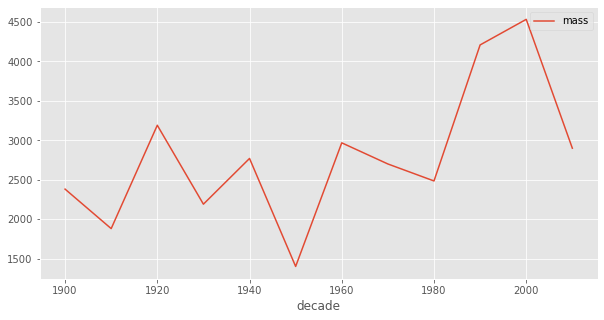

In [109]:
# Create your line plot here.
x.plot(kind='line',x='decade',y='mass');

<!-- END QUESTION -->



As seen above, it appears that some decadal medians were much larger than others. In particular, the 2000s decade seemed to have much heavier meteorites than other decades. Is this a real phenomenon or is it simply due to chance?

Our intuition tells us that a meteorite's mass should essentially be random. That is, when Mother Nature decides to throw a meteorite at Earth, she does not first check the year.

### Question 6.3 ⭐⭐

Let's test the following hypotheses:

- **Null Hypothesis**: The masses of meteorites in each decade are drawn from the same distribution, and the high median mass of meteorites from the 2000s decade is solely due to random chance.
- **Alternative Hypothesis**: The high median mass of meteorites from the 2000s decade is due to reasons other than random chance. 

For our test statistic, we'll use the **median mass of meteorites in a group**. 

Let's outline how we'll perform our hypothesis test. Let $n$ be the number of meteorites that were seen falling in the 2000s decade. Under the null hypothesis, values in the `'decade'` column have no relationship with values in the `'mass'` column. This means that we are able to repeatedly:
- randomly select $n$ meteorites from `seen_since_1900` (**without replacement**), and
- compute the median of their mass.

Under the null hypothesis, these medians should be close to the observed decadal median for the 2000s decade. Generate **1,000** values of the test statistic (median meteorite mass) using the above approach and place them in an array called `simulated_medians`.

**_Hint:_** First, assign `n` to the number of meteorites seen in the 2000s decade. Make sure to only include meteorites seen from the 2000s decade and not the 2010s decade. If you later run into an error that says `Argument n is not an integer`, convert `n` to an integer by using `n = int(n)`.

In [110]:
simulated_medians = np.array([])
n=seen_since_1900[seen_since_1900.get('decade')==2000].shape[0]
for i in np.arange(1000):
    sample_df=seen_since_1900.sample(n)
    medians=sample_df.get('mass').median()
    simulated_medians=np.append(simulated_medians,medians)
simulated_medians

array([3608.5 , 2850.  , 3597.5 , 2370.5 , 1615.  , 2069.37, 3803.  ,
       1892.5 , 2256.  , 3218.  , 2433.5 , 2670.  , 1633.75, 2443.  ,
       2775.  , 3648.5 , 2125.  , 1947.5 , 3125.  , 1752.5 , 1885.25,
       2474.5 , 3396.5 , 2168.5 , 3450.  , 3855.  , 3529.  , 2634.  ,
       2955.  , 2418.5 , 1522.  , 3661.  , 3467.5 , 1450.  , 2493.5 ,
       3879.  , 2040.  , 2500.  , 3265.  , 3694.85, 2900.  , 3000.  ,
       3549.5 , 3630.  , 2090.  , 2000.  , 3809.  , 2878.  , 2818.  ,
       1502.  , 2699.  , 3820.  , 2015.5 , 3250.  , 3730.  , 2510.  ,
       2365.  , 3309.  , 1919.37, 1357.5 , 2312.5 , 2510.  , 1511.5 ,
       1296.  , 2474.5 , 2534.  , 3433.5 , 1980.  , 2277.  , 3856.5 ,
       2680.  , 3308.75, 1500.  , 1381.5 , 3583.5 , 1755.  , 2066.  ,
       4041.  , 2238.5 , 4150.  , 2760.  , 1815.  , 2400.  , 2375.  ,
       2609.  , 1825.  , 2316.  , 3858.  , 3475.  , 2765.  , 2927.5 ,
       2176.5 , 2534.  , 3795.  , 2727.5 , 4213.  , 2075.  , 2675.  ,
       4136.5 , 1530

In [111]:
grader.check("q6_3")

q6_3 results: All test cases passed!

Run the cell below to see the empirical distribution of our test statistic. The distribution below represents the median masses we would expect to observe if meteorite masses are unrelated to decades. The observed median mass (of the 2000s decade) is indicated by the black vertical line. 

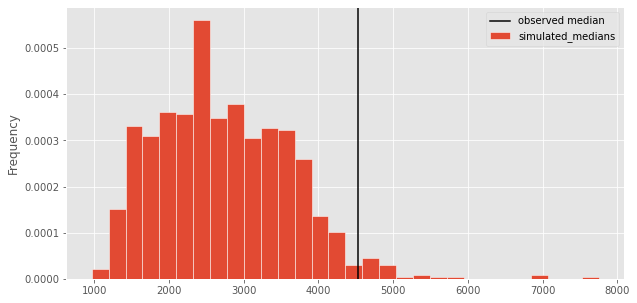

In [112]:
# Don't change this cell; just run it.
bpd.DataFrame().assign(simulated_medians=simulated_medians).plot(kind='hist', density=True, bins=30, ec='w')
plt.axvline(x=seen_since_1900[seen_since_1900.get('decade') == 2000]
             .get('mass').median(), color='black', label='observed median')
plt.legend();


### Question 6.4 

Compute the p-value of the hypothesis test, and assign it to the variable `decadal_p_value`.

In [113]:
decadal_p_value = np.count_nonzero(simulated_medians>=seen_since_1900[seen_since_1900.get('decade') == 2000]
             .get('mass').median())/1000
decadal_p_value

0.025

In [114]:
grader.check("q6_4")

q6_4 results: All test cases passed!

It appears that at the 0.05 significance level, we'd reject the null hypothesis that decade is unrelated to meteorite mass. 

This is an interesting result! But it's not clear why the decadal median in 2000 is higher than earlier decadal medians. Perhaps due to the effects of global warming, it's becoming harder to see smaller meteorites, and hence the ones that we see are heavier. Or perhaps there are systematic errors in how the data was recorded. What are other reasons you can come up with? 🤔

Now that we've explored the decade with the heaviest meteorites, let's see if there are any decades where the median mass of meteorites is **lower** than can be explained by random chance alone.

The cell below provides an interactive slider for you to explore this question.  With each adjustment of the slider to a new decade, we run a new hypothesis test with the following hypotheses:

- **Null Hypothesis**: The masses of meteorites in each decade are drawn from the same distribution.
- **Alternative Hypothesis**: The median mass of meteorites from the selected decade is **too low** to be explained by random chance alone.

The p-value for each hypothesis test is displayed in the top-right corner.

In [115]:
# Don't change this cell; just run it.
interact(decadal_interact, decade=IntSlider(
    value=1900,
    min=1900,
    max=2010,
    step=10,
    description='Decade:',
    continuous_update=False
), df=fixed(saw_fall));

interactive(children=(IntSlider(value=1900, continuous_update=False, description='Decade:', max=2010, min=1900…

### Question 6.5 

Interact with the widget above and move the slider to each decade. Based on your observations, assign `'too_low'` to a **list** of decades for which we can reject the null hypothesis at the 0.05 significance level. If there are no such decades, then `'too_low'` should be an empty list.

In [116]:
too_low = [1950]
too_low

[1950]

In [117]:
grader.check("q6_5")

q6_5 results: All test cases passed!

## Finish Line 🏁

**Congratulations!** 🎉  Great work finishing the Final Project! If you're interested in trying to see some meteors yourself, tonight is a good time to head outside. We are currently in the midst of a [major meteor shower](https://www.amsmeteors.org/meteor-showers/2020-meteor-shower-list/)! NASA says the [Gemenids meteor shower](https://science.nasa.gov/solar-system/meteors-meteorites/geminids/) is "one of the best and most reliable annual meteor showers" with up to 120 visible meteors per hour under perfect conditions. Look up and scan the sky for bright yellow streaks! Maybe one will land nearby!

**_Citations:_** Did you use any generative artificial intelligence tools to assist you on this assignment? If so, please state, for each tool you used, the name of the tool (ex. ChatGPT) and the problem(s) in this assignment where you used the tool for help.

<hr style="color:Maroon;background-color:Maroon;border:0 none; height: 3px;">

Please cite tools here.

<hr style="color:Maroon;background-color:Maroon;border:0 none; height: 3px;">


To submit your assignment:

1. Select `Kernel -> Restart & Run All` to ensure that you have executed all cells, including the test cells. <p style="color: red"><b>Important!</b> We will allot 20 minutes of computer time to run your notebook. If your notebook takes longer than this to run, it may not pass the autograder! Run "Kernel -> Restart and Run All" to time how long your notebook takes. A notebook with correct answers should take less than 5 minutes.</p>
2. Read through the notebook to make sure everything is fine and all tests passed.
3. Run the cell below to run all tests, and make sure that they all pass.
4. Download your notebook using `File -> Download as -> Notebook (.ipynb)`, then upload your notebook to Gradescope.
5. If you worked with a partner, select your partner on Gradescope after submitting. **Only one of you needs to submit!**
6. Stick around while the Gradescope autograder grades your work. Make sure you see that all tests have passed on Gradescope.
7. Check that you have a confirmation email from Gradescope and save it as proof of your submission. 

If running all the tests at once causes a test to fail that didn't fail when you ran the notebook in order, check to see if you changed a variable's value later in your code. Make sure to use new variable names instead of reusing ones that are used in the tests.

Remember, the tests here and on Gradescope just check the format of your answers. We will run correctness tests after the assignment's due date has passed.

In [118]:
grader.check_all()

q1_1 results: All test cases passed!

q1_2 results: All test cases passed!

q1_3 results: All test cases passed!

q1_4 results: All test cases passed!

q1_5 results: All test cases passed!

q2_1 results: All test cases passed!

q2_2 results: All test cases passed!

q2_3 results: All test cases passed!

q2_4 results: All test cases passed!

q2_5 results: All test cases passed!

q2_6 results: All test cases passed!

q2_7 results: All test cases passed!

q2_8 results: All test cases passed!

q2_9 results: All test cases passed!

q3_1 results: All test cases passed!

q3_2 results: All test cases passed!

q3_3 results: All test cases passed!

q3_4 results: All test cases passed!

q3_5 results: All test cases passed!

q3_6 results: All test cases passed!

q3_7 results: All test cases passed!

q3_8 results: All test cases passed!

q3_9 results: All test cases passed!

q4_1 results: All test cases passed!

q4_2 results: All test cases passed!

q4_3 results: All test cases passed!

q4_4 results